In [ ]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Importación de librerías

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.ensemble import (
    RandomForestClassifier,
    GradientBoostingClassifier,
    StackingClassifier,
)
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, f1_score
import pandas as pd
import numpy as np

# Datos

In [ ]:
%cd /content/drive/MyDrive/Colab Notebooks/PROY 3

df = pd.read_csv("minable_view_post.csv")

/content/drive/MyDrive/Colab Notebooks/PROY 3


In [ ]:
pd.set_option('display.max_columns', None)

df

,id,track_name,artist_name,new_popularity_2025,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity_2021,speechiness,tempo,valence,year,genres,main_genre,subgenre_1,subgenre_2,genres_artists,acousticness_cat,danceability_cat,energy_cat,explicit_cat,instrumentalness_cat,liveness_cat,loudness_cat,speechiness_cat,tempo_cat,valence_cat,month_cat,featuring_cat,popularity_2021_cat,duration_cat,key_cat,imputed_date_cat,mode_cat,year_cat,genres_from_artists_cat,popularity_2025_cat,album,popularity_2024,popularity_2024_cat,month_sin,month_cos,dayofweek_sin,dayofweek_cos,imputed_genre,confidence,is_weekend,season,years_since_release,is_positive_mood,has_lyrics,is_loud,is_live,is_common_key,is_instrumental,is_energetic,is_duration_friendly,is_danceable,is_acoustic,energy_valence,speechiness_explicit,danceability_tempo
0,0cS0A1fUEUd1EW3FcF8AEI,Keep A Song In Your Soul,Mamie Smith,18,0.991000,0.598,168333,0.224,0,0.000522,5,0.3790,-12.628,0,12,0.0936,149.976,0.6340,1920.0,blues,blues,NaN,NaN,"[['classic blues', 'blues', 'ragtime', 'countr...",High,High,Low,No,Low,Low,Low,Low,Allegro,High,January,0,FLOP,Mid,F,Yes,Minor,20s,Yes,FLOP,unknown,-1,unknown,0.500000,0.866025,0.433884,-0.900969,not required,0.000000,False,Winter,105.0,False,False,False,False,True,False,False,True,False,True,0.142016,0.0000,89.685648
1,11m7laMUgmOKqI3oYzuhne,Golfing Papa,Mamie Smith,1,0.993000,0.647,163827,0.186,0,0.000018,0,0.5190,-12.098,1,4,0.1740,97.600,0.6890,1920.0,blues,blues,NaN,NaN,"[['classic blues', 'blues', 'ragtime', 'countr...",High,High,Low,No,Low,High,Low,Low,Andante,High,January,0,FLOP,Mid,C,Yes,Major,20s,No,FLOP,unknown,-1,unknown,0.500000,0.866025,0.433884,-0.900969,not required,0.000000,False,Winter,105.0,False,False,False,False,True,False,False,True,True,True,0.128154,0.0000,63.147200
2,19Lc5SfJJ5O1oaxY0fpwfh,True House Music - Xavier Santos & Carlos Gomi...,Oscar Velazquez,13,0.000173,0.730,422087,0.798,0,0.801000,2,0.1280,-7.311,1,17,0.0425,127.997,0.0422,1920.0,tribal house,tribal house,NaN,NaN,[['tribal house']],Low,High,High,No,High,Low,Low,Low,Allegro,Low,January,0,FLOP,Large,D,No,Major,20s,Yes,FLOP,unknown,-1,unknown,0.500000,0.866025,0.433884,-0.900969,not required,0.000000,False,Winter,105.0,False,False,False,False,True,True,True,False,True,False,0.033676,0.0000,93.437810
3,2hJjbsLCytGsnAHfdsLejp,Xuniverxe,Mikesmooveee,0,0.295000,0.704,165224,0.707,1,0.000246,10,0.4020,-6.036,0,2,0.0768,122.076,0.2990,1920.0,unknown,unknown,NaN,NaN,"[['taiwanese indie', 'chinese indie', 'taiwane...",Low,High,High,Yes,Low,Low,Low,Low,Allegro,Low,January,0,FLOP,Mid,A♯/B♭,No,Minor,20s,Yes,FLOP,unknown,-1,unknown,-0.866025,0.500000,-0.433884,-0.900969,rock,0.223333,False,Autumn,105.0,False,False,False,False,False,False,False,True,True,False,0.211393,0.0768,85.941504
4,3HnrHGLE9u2MjHtdobfWl9,Crazy Blues - 78rpm Version,Mamie Smith & Her Jazz Hounds,3,0.996000,0.424,198627,0.245,0,0.799000,5,0.2350,-11.470,1,9,0.0397,103.870,0.4770,1920.0,unknown,unknown,NaN,NaN,[['Faltante']],High,Low,Low,No,High,Low,Low,Low,Andante,Low,October,0,FLOP,Mid,F,Yes,Major,20s,No,FLOP,unknown,-1,unknown,0.500000,0.866025,0.433884,-0.900969,jazz,0.633333,False,Winter,105.0,False,False,False,False,True,True,False,True,False,True,0.116865,0.0000,44.040880
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
280448,4NqQaovM14WR2hNPMFxgjb,25/8,Bad Bunny,70,0.092000,0.761,243276,0.732,0,0.000000,4,0.0716,-5.469,0,73,0.0549,151.982,0.5420,2020.0,"trap, hip-hop, pop, rap, latin",pop,hip-hop,rap,"[['reggaeton', 'trap latino', 'latin', 'urbano...",Low,High,High,No,Low,Low,Low,Low,Allegro,High,January,0,MID-HIT,Mid,E,No,Minor,2020s,No,MID-HIT,unknown,70,MID-HIT,0.866025,0.500000,-0.433884,-0.900969,not required,0.

In [ ]:
# prompt: crear 2 columnas nuevas en el df.
# La primera será una variable binaria 0-1 llamada "genre_was_imputed", 0 si el valor de "imputed_genre" es "not required", else 1.
# La segunda, una copia de "imputed_genre", pero donde "genre_was_imputed" es 0, sustituir el valor por el que está guardado en "main_genre"

# Crear la variable 'genre_was_imputed'
df['genre_was_imputed'] = df['imputed_genre'].apply(lambda x: False if x == 'not required' else True)

# Crear la variable 'genre_final'
df['genre_final'] = df['imputed_genre']
df.loc[df['genre_was_imputed'] == False, 'genre_final'] = df.loc[df['genre_was_imputed'] == False, 'main_genre']



In [ ]:
df

,id,track_name,artist_name,new_popularity_2025,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity_2021,speechiness,tempo,valence,year,genres,main_genre,subgenre_1,subgenre_2,genres_artists,acousticness_cat,danceability_cat,energy_cat,explicit_cat,instrumentalness_cat,liveness_cat,loudness_cat,speechiness_cat,tempo_cat,valence_cat,month_cat,featuring_cat,popularity_2021_cat,duration_cat,key_cat,imputed_date_cat,mode_cat,year_cat,genres_from_artists_cat,popularity_2025_cat,album,popularity_2024,popularity_2024_cat,month_sin,month_cos,dayofweek_sin,dayofweek_cos,imputed_genre,confidence,is_weekend,season,years_since_release,is_positive_mood,has_lyrics,is_loud,is_live,is_common_key,is_instrumental,is_energetic,is_duration_friendly,is_danceable,is_acoustic,energy_valence,speechiness_explicit,danceability_tempo,genre_was_imputed,genre_final
0,0cS0A1fUEUd1EW3FcF8AEI,Keep A Song In Your Soul,Mamie Smith,18,0.991000,0.598,168333,0.224,0,0.000522,5,0.3790,-12.628,0,12,0.0936,149.976,0.6340,1920.0,blues,blues,NaN,NaN,"[['classic blues', 'blues', 'ragtime', 'countr...",High,High,Low,No,Low,Low,Low,Low,Allegro,High,January,0,FLOP,Mid,F,Yes,Minor,20s,Yes,FLOP,unknown,-1,unknown,0.500000,0.866025,0.433884,-0.900969,not required,0.000000,False,Winter,105.0,False,False,False,False,True,False,False,True,False,True,0.142016,0.0000,89.685648,False,blues
1,11m7laMUgmOKqI3oYzuhne,Golfing Papa,Mamie Smith,1,0.993000,0.647,163827,0.186,0,0.000018,0,0.5190,-12.098,1,4,0.1740,97.600,0.6890,1920.0,blues,blues,NaN,NaN,"[['classic blues', 'blues', 'ragtime', 'countr...",High,High,Low,No,Low,High,Low,Low,Andante,High,January,0,FLOP,Mid,C,Yes,Major,20s,No,FLOP,unknown,-1,unknown,0.500000,0.866025,0.433884,-0.900969,not required,0.000000,False,Winter,105.0,False,False,False,False,True,False,False,True,True,True,0.128154,0.0000,63.147200,False,blues
2,19Lc5SfJJ5O1oaxY0fpwfh,True House Music - Xavier Santos & Carlos Gomi...,Oscar Velazquez,13,0.000173,0.730,422087,0.798,0,0.801000,2,0.1280,-7.311,1,17,0.0425,127.997,0.0422,1920.0,tribal house,tribal house,NaN,NaN,[['tribal house']],Low,High,High,No,High,Low,Low,Low,Allegro,Low,January,0,FLOP,Large,D,No,Major,20s,Yes,FLOP,unknown,-1,unknown,0.500000,0.866025,0.433884,-0.900969,not required,0.000000,False,Winter,105.0,False,False,False,False,True,True,True,False,True,False,0.033676,0.0000,93.437810,False,tribal house
3,2hJjbsLCytGsnAHfdsLejp,Xuniverxe,Mikesmooveee,0,0.295000,0.704,165224,0.707,1,0.000246,10,0.4020,-6.036,0,2,0.0768,122.076,0.2990,1920.0,unknown,unknown,NaN,NaN,"[['taiwanese indie', 'chinese indie', 'taiwane...",Low,High,High,Yes,Low,Low,Low,Low,Allegro,Low,January,0,FLOP,Mid,A♯/B♭,No,Minor,20s,Yes,FLOP,unknown,-1,unknown,-0.866025,0.500000,-0.433884,-0.900969,rock,0.223333,False,Autumn,105.0,False,False,False,False,False,False,False,True,True,False,0.211393,0.0768,85.941504,True,rock
4,3HnrHGLE9u2MjHtdobfWl9,Crazy Blues - 78rpm Version,Mamie Smith & Her Jazz Hounds,3,0.996000,0.424,198627,0.245,0,0.799000,5,0.2350,-11.470,1,9,0.0397,103.870,0.4770,1920.0,unknown,unknown,NaN,NaN,[['Faltante']],High,Low,Low,No,High,Low,Low,Low,Andante,Low,October,0,FLOP,Mid,F,Yes,Major,20s,No,FLOP,unknown,-1,unknown,0.500000,0.866025,0.433884,-0.900969,jazz,0.633333,False,Winter,105.0,False,False,False,False,True,True,False,True,False,True,0.116865,0.0000,44.040880,True,jazz
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
280448,4NqQaovM14WR2hNPMFxgjb,25/8,Bad Bunny,70,0.092000,0.761,243276,0.732,0,0.000000,4,0.0716,-5.469,0,73,0.0549,151.982,0.5420,2020.0,"trap, hip-hop, pop, rap, latin",pop,hip-hop,rap,"[['reggaeton', 'trap latino', 'latin', 'urbano...",Low,High,High,No,Low,Low,Low,Low,Allegro,High,January,0,MID-HIT,Mid

# Predecir 0 o >0

In [ ]:
features = [
    col
    for col in df.columns.to_list()
    if col
    not in [
        "id",
        "track_name",
        "artist_name",
        "new_popularity_2025",
        "genres",
        "main_genre",
        "subgenre_1",
        "subgenre_2",
        "genres_artists",
        "acousticness_cat",
        "danceability_cat",
        "energy_cat",
        "explicit_cat",
        "instrumentalness_cat",
        "liveness_cat",
        "loudness_cat",
        "speechiness_cat",
        "tempo_cat",
        "valence_cat",
        "month_cat",
        "featuring_cat",
        "popularity_2021_cat",
        "duration_cat",
        "key_cat",
        "imputed_date_cat",
        "mode_cat",
        "year_cat",
        "genres_from_artists_cat",
        "popularity_2025_cat",
        "album",
        "popularity_2024",
        "popularity_2024_cat",
        "popularity_2021",
        "confidence",
        "imputed_genre"
        #, "genre_final", "genre_was_imputed"
    ]
]
target = "new_popularity_2025"

In [ ]:
# prompt: recuento de valores diferentes de genre_final en X
X = df[features]
X.dropna(inplace=True)
y = (df[target] > 0).loc[X.index]



# Count the occurrences of different values in 'genre_final'
# 1) Cálculo de los 15 géneros más frecuentes
genre_counts = X['genre_final'].value_counts()
top20 = genre_counts.head(20)

# 2) Print de los 15 géneros
print("Top 20 géneros por count:")
print(top20)

# 3) Comprobación de 'True' en was_imputed para esos géneros
print("\n¿Tienen 'True' en was_imputed al menos una vez?")
for genre in top20.index:
    has_true = X.loc[X['genre_final'] == genre, 'genre_was_imputed'].any()
    print(f"{genre}: {has_true}")

# prompt: recuento de nan en X por columna ?

# 1) Obtener los 20 géneros más frecuentes
top20_genres = top20.index

# 2) Crear máscara de filtrado
mask = X['genre_final'].isin(top20_genres)

# 3) Filtrar X e y (asegúrate de que y tenga el mismo índice que X)
X = X.loc[mask].copy()
y = y.loc[mask].copy()

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

# Filtra solo las columnas numéricas
num_cols = X_train.select_dtypes(include=["int64", "float64"])

# Ahora sí puedes calcular la matriz de correlaciones
corr_matrix = num_cols.corr().abs()

# Parte superior de la matriz
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Detecta colinealidades altas (> 0.9 por ejemplo)
high_corr_cols = [column for column in upper.columns if any(upper[column] > 0.9)]

# Opcional: elimina esas columnas del X_train
X_train_filtered = X_train.drop(columns=high_corr_cols)
X_test_filtered  = X_test.drop(columns=high_corr_cols)

print(X_train_filtered.shape, y_train.shape, X_test_filtered.shape, y_test.shape)

<ipython-input-7-87989a4fecc1>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.dropna(inplace=True)


Top 20 géneros por count:
genre_final
pop                 85687
rock                35273
rap                 21126
jazz                15488
hip-hop             11663
electronic           6257
country              5850
c-pop                5111
soul                 4792
ghazal               3859
folk                 2835
christmas            2537
blues                2451
tango                2403
metal                1982
indie                1840
female vocalists     1699
bolero               1343
punk                 1271
trance               1252
Name: count, dtype: int64

¿Tienen 'True' en was_imputed al menos una vez?
pop: True
rock: True
rap: True
jazz: True
hip-hop: True
electronic: True
country: True
c-pop: True
soul: True
ghazal: True
folk: True
christmas: False
blues: True
tango: True
metal: True
indie: True
female vocalists: False
bolero: False
punk: False
trance: False
(171775, 35) (171775,) (42944, 35) (42944,)


In [ ]:


# Count NaN values per column in X
nan_counts = X.isna().sum()
nan_counts


,0
acousticness,0
danceability,0
duration_ms,0
energy,0
explicit,0
instrumentalness,0
key,0
liveness,0
loudness,0
mode,0


In [ ]:
# prompt: haz un print por cada variable en X, indicando tipo, por cada categorica imprime tambien los niveles distintos

for col in X_train_filtered.columns:
  print(f"Variable: {col}")
  print(f"Tipo de dato: {X_train_filtered[col].dtype}")
  if X_train_filtered[col].dtype == 'object':
    print(f"Niveles distintos: {X_train_filtered[col].unique()}")
  print("-" * 20)


Variable: acousticness
Tipo de dato: float64
--------------------
Variable: danceability
Tipo de dato: float64
--------------------
Variable: duration_ms
Tipo de dato: int64
--------------------
Variable: energy
Tipo de dato: float64
--------------------
Variable: explicit
Tipo de dato: int64
--------------------
Variable: instrumentalness
Tipo de dato: float64
--------------------
Variable: key
Tipo de dato: int64
--------------------
Variable: liveness
Tipo de dato: float64
--------------------
Variable: loudness
Tipo de dato: float64
--------------------
Variable: mode
Tipo de dato: int64
--------------------
Variable: speechiness
Tipo de dato: float64
--------------------
Variable: tempo
Tipo de dato: float64
--------------------
Variable: valence
Tipo de dato: float64
--------------------
Variable: year
Tipo de dato: float64
--------------------
Variable: month_sin
Tipo de dato: float64
--------------------
Variable: month_cos
Tipo de dato: float64
--------------------
Variable: d

# FINAL 0 O > 0

In [ ]:
from sklearn.preprocessing import OneHotEncoder

# Sólo las dos columnas categóricas
categorical_features = ["season", "genre_final"]

ohe = OneHotEncoder(handle_unknown="ignore")
ohe.fit(X_train[categorical_features])

# Categorías por columna
print("Categorías detectadas:", ohe.categories_)
# Número de columnas tras el encode
print("Número total de dummies:", len(ohe.get_feature_names_out(categorical_features)))


Categorías detectadas: [array(['Autumn', 'Spring', 'Summer', 'Winter'], dtype=object), array(['blues', 'bolero', 'c-pop', 'christmas', 'country', 'electronic',
       'female vocalists', 'folk', 'ghazal', 'hip-hop', 'indie', 'jazz',
       'metal', 'pop', 'punk', 'rap', 'rock', 'soul', 'tango', 'trance'],
      dtype=object)]
Número total de dummies: 24


In [ ]:
import numpy as np
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    precision_score,
    recall_score,
    roc_auc_score
)

# 1) Preprocesado
numeric_features = X_train_filtered.select_dtypes(include=["int64","float64"]).columns.tolist()
categorical_features = X_train_filtered.select_dtypes(include=["object"]).columns.tolist()

preprocessor = ColumnTransformer([
    ("num", StandardScaler(), numeric_features),
    ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_features),
])

# 2) Definición de modelos y sus param_grids
grids1 = {
    'rf': {
        'estimator': RandomForestClassifier(class_weight='balanced', random_state=42),
        'param_grid': {
            'clf__n_estimators':       [300],
            'clf__max_depth':          [20],
            'clf__min_samples_split':  [2, 5],
            'clf__min_samples_leaf':   [2],
            'clf__max_features':       ['sqrt'],
        }
    },
    'xgb': {
        'estimator': XGBClassifier(eval_metric="logloss", use_label_encoder=False, random_state=42),
        'param_grid': {
            'clf__n_estimators':       [300],
            'clf__learning_rate':      [0.1],
            'clf__max_depth':          [5, 10],
            'clf__gamma':              [0],
        }
    }
}

# 3) GridSearch por cada modelo, guardado del mejor
best_models = {}
for name, cfg in grids1.items():
    pipe = Pipeline([('preprocessor', preprocessor), ('clf', cfg['estimator'])])
    grid = GridSearchCV(
        pipe,
        cfg['param_grid'],
        scoring='f1_macro',
        cv=3,
        refit=True,
        verbose=3,
        n_jobs=1
    )
    print(f"\n=== Training {name.upper()} ===")
    grid.fit(X_train_filtered, y_train)
    best_models[name] = grid.best_estimator_

# 4) Cálculo de métricas de test para cada mejor modelo
test_metrics = []
for name, model in best_models.items():
    y_pred = model.predict(X_test_filtered)
    y_proba = model.predict_proba(X_test_filtered)[:, 1] if hasattr(model, "predict_proba") else None

    metrics = {
        'model': name,
        'accuracy':         accuracy_score(y_test, y_pred),
        'f1_macro':         f1_score(y_test, y_pred, average='macro'),
        'precision_macro':  precision_score(y_test, y_pred, average='macro'),
        'recall_macro':     recall_score(y_test, y_pred, average='macro'),
    }
    if y_proba is not None:
        metrics['roc_auc'] = roc_auc_score(y_test, y_proba)

    test_metrics.append(metrics)

# 5) Guardar en DataFrame
df_results_model_1 = pd.DataFrame(test_metrics)

# Mostrar resultados-
df_results_model_1


=== Training RF ===
Fitting 3 folds for each of 2 candidates, totalling 6 fits


KeyboardInterrupt: 

In [ ]:
grids2 = {'gbc': {
        'estimator': GradientBoostingClassifier(random_state=42),
        'param_grid': {

            'clf__n_estimators':       [200],
            'clf__learning_rate':      [0.1],
            'clf__max_depth':          [5, 7],
            'clf__subsample':          [0.8, 1.0],

        }
    },
    'lr': {
        'estimator': LogisticRegression(random_state=42, max_iter=1000),
        'param_grid': {
            'clf__penalty':           ['l2', 'l1'],
            'clf__C':                 [0.01, 0.1, 1, 10],
            'clf__solver':            ['liblinear'],
        }
    }
}


for name, cfg in grids2.items():
    pipe = Pipeline([('preprocessor', preprocessor), ('clf', cfg['estimator'])])
    grid = GridSearchCV(
        pipe,
        cfg['param_grid'],
        scoring='f1_macro',
        cv=3,
        refit=True,
        verbose=3,
        n_jobs=1
    )
    print(f"\n=== Training {name.upper()} ===")
    grid.fit(X_train_filtered, y_train)
    best_models[name] = grid.best_estimator_

# 4) Cálculo de métricas de test para cada mejor modelo
test_metrics = []
for name, model in best_models.items():
    y_pred = model.predict(X_test_filtered)
    y_proba = model.predict_proba(X_test_filtered)[:, 1] if hasattr(model, "predict_proba") else None

    metrics = {
        'model': name,
        'accuracy':         accuracy_score(y_test, y_pred),
        'f1_macro':         f1_score(y_test, y_pred, average='macro'),
        'precision_macro':  precision_score(y_test, y_pred, average='macro'),
        'recall_macro':     recall_score(y_test, y_pred, average='macro'),
    }
    if y_proba is not None:
        metrics['roc_auc'] = roc_auc_score(y_test, y_proba)

    test_metrics.append(metrics)

# 5) Guardar en DataFrame
df_results_model_1 = pd.DataFrame(test_metrics)

# Mostrar resultados-
df_results_model_1


=== Training GBC ===
Fitting 3 folds for each of 4 candidates, totalling 12 fits
[CV 1/3] END clf__learning_rate=0.1, clf__max_depth=5, clf__n_estimators=200, clf__subsample=0.8;, score=0.636 total time= 4.3min
[CV 2/3] END clf__learning_rate=0.1, clf__max_depth=5, clf__n_estimators=200, clf__subsample=0.8;, score=0.642 total time= 4.2min
[CV 3/3] END clf__learning_rate=0.1, clf__max_depth=5, clf__n_estimators=200, clf__subsample=0.8;, score=0.636 total time= 4.2min
[CV 1/3] END clf__learning_rate=0.1, clf__max_depth=5, clf__n_estimators=200, clf__subsample=1.0;, score=0.635 total time= 5.2min
[CV 2/3] END clf__learning_rate=0.1, clf__max_depth=5, clf__n_estimators=200, clf__subsample=1.0;, score=0.639 total time= 5.2min
[CV 3/3] END clf__learning_rate=0.1, clf__max_depth=5, clf__n_estimators=200, clf__subsample=1.0;, score=0.634 total time= 5.3min
[CV 1/3] END clf__learning_rate=0.1, clf__max_depth=7, clf__n_estimators=200, clf__subsample=0.8;, score=0.645 total time= 5.9min
[CV 2/3]

,model,accuracy,f1_macro,precision_macro,recall_macro,roc_auc
0,rf,0.690341,0.675479,0.674303,0.689567,0.761970
1,xgb,0.717842,0.655327,0.691012,0.648198,0.766888
2,gbc,0.718191,0.649313,0.694743,0.642726,0.762162
3,lr,0.684263,0.531557,0.685817,0.562024,0.673535


In [ ]:
# prompt: sacar toda la informacion printeando los items de best_models

for name, model in best_models.items():
    print(f"Model: {name}")
    print(model)
    print("-" * 20)
    print(model.get_params())
    print("-" * 20 )



Model: rf
Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['acousticness',
                                                   'danceability',
                                                   'duration_ms', 'energy',
                                                   'explicit',
                                                   'instrumentalness', 'key',
                                                   'liveness', 'loudness',
                                                   'mode', 'speechiness',
                                                   'tempo', 'valence', 'year',
                                                   'month_sin', 'month_cos',
                                                   'dayofweek_sin',
                                                   'dayofweek_cos',
                                                   'energy_valence',
                     

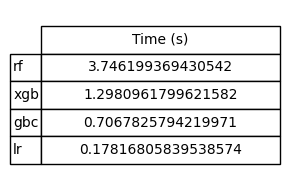

In [ ]:
# prompt: obtener los tiempos de prediccion de cada uno de los mejores modelos de best_models y printearlo en una tabla bonita fig, ax = plt.subplots(figsize=(3,2))
# ax.axis('off')
# tbl = ax.table(
#     cellText=df_table.values,
#     rowLabels=df_table.index,
#     colLabels=['Tiempo (s)'],
#     loc='center',
#     cellLoc='center'
# )
# tbl.auto_set_font_size(False)
# tbl.set_fontsize(10)
# tbl.scale(1, 1.5)
# plt.tight_layout()
# plt.show()

import time
import matplotlib.pyplot as plt
import pandas as pd

# Assuming 'best_models' is defined as in the original code
# and contains the trained models.

prediction_times = []
for name, model in best_models.items():
    start_time = time.time()
    model.predict(X_test_filtered)  # Replace with your actual prediction task
    end_time = time.time()
    prediction_times.append({'model': name, 'time': end_time - start_time})

df_table = pd.DataFrame(prediction_times).set_index('model')

fig, ax = plt.subplots(figsize=(3, 2))
ax.axis('off')
tbl = ax.table(
    cellText=df_table.values,
    rowLabels=df_table.index,
    colLabels=['Time (s)'],
    loc='center',
    cellLoc='center'
)
tbl.auto_set_font_size(False)
tbl.set_fontsize(10)
tbl.scale(1, 1.5)
plt.tight_layout()
plt.show()


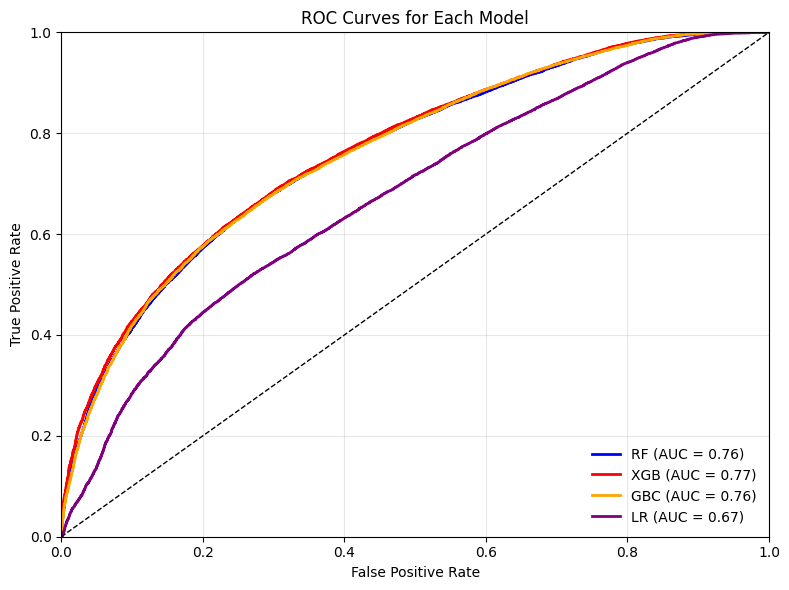

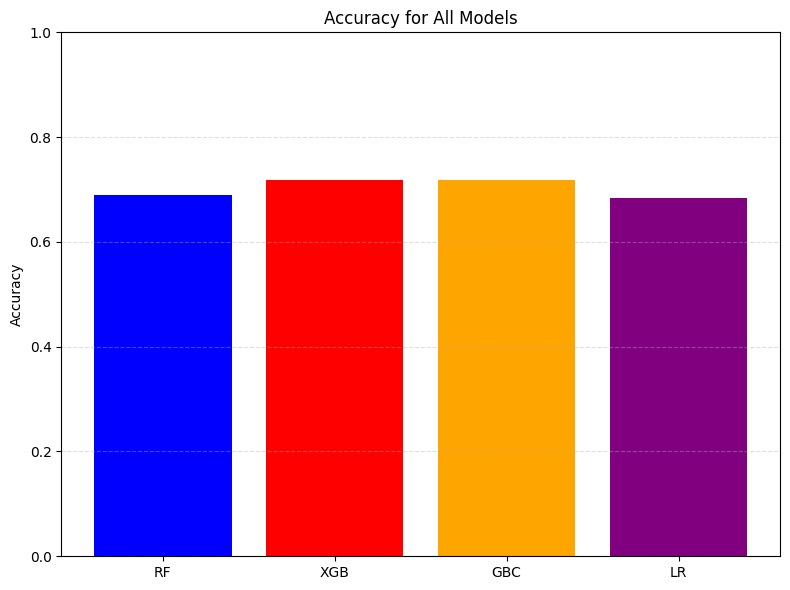

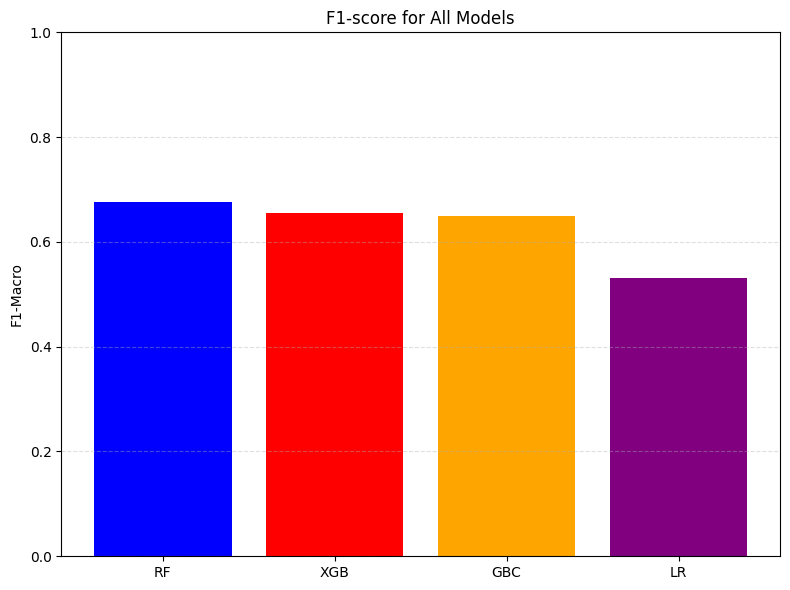

In [ ]:
# prompt: dibujar para cada mejor modelo el AUC, también 2 gráficos adicionales, uno para accuracy y otro para f1-score de todos los modelos. Patron colores: rf:azul, xgb:rojo, gbm:naranja, lr:violeta

import matplotlib.pyplot as plt

# Assuming df_results_model_1 is your DataFrame with model results
# and best_models contains your trained models

# Define colors for each model
colors = {'rf': 'blue', 'xgb': 'red', 'gbc': 'orange', 'lr': 'purple'}
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# --- Assumptions:
#    best_models: dict with keys matching df_results_model_1['model'] and values the fitted classifiers
#    X_test_filtered, y_test: your test features and labels
#    df_results_model_1: DataFrame with columns ['model','accuracy','f1_macro','precision_macro','recall_macro','roc_auc']
#    colors: {'rf':'blue','xgb':'red','gbc':'orange','lr':'purple'}
# ---

# 1) Plot ROC curves
plt.figure(figsize=(8, 6))
for name, model in best_models.items():
    # get predicted probability for the positive class
    y_prob = model.predict_proba(X_test_filtered)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr,
             label=f"{name.upper()} (AUC = {roc_auc:.2f})",
             color=colors[name],
             linewidth=2)

# chance line
plt.plot([0, 1], [0, 1], 'k--', linewidth=1)
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Each Model')
plt.legend(loc='lower right', frameon=False)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 2) Accuracy bar plot
plt.figure(figsize=(8, 6))
plt.bar(df_results_model_1['model'].str.upper(),
        df_results_model_1['accuracy'],
        color=[colors[m] for m in df_results_model_1['model']])
plt.ylabel('Accuracy')
plt.title('Accuracy for All Models')
plt.ylim(0, 1)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

# 3) F1-score bar plot
plt.figure(figsize=(8, 6))
plt.bar(df_results_model_1['model'].str.upper(),
        df_results_model_1['f1_macro'],
        color=[colors[m] for m in df_results_model_1['model']])
plt.ylabel('F1-Macro')
plt.title('F1-score for All Models')
plt.ylim(0, 1)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


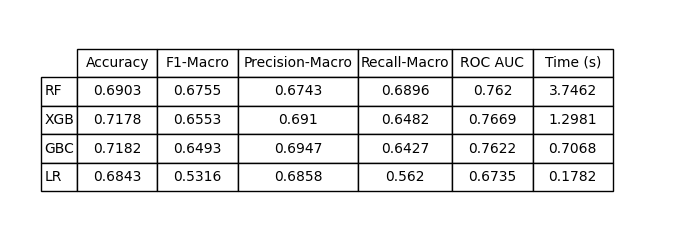

In [ ]:
import pandas as pd

# Construct the DataFrame with performance metrics and timing
df_classification = pd.DataFrame({
    'model': ['RF', 'XGB', 'GBC', 'LR'],
    'Accuracy': [0.6903, 0.7178, 0.7182, 0.6843],
    'F1-Macro': [0.6755, 0.6553, 0.6493, 0.5316],
    'Precision-Macro': [0.6743, 0.6910, 0.6947, 0.6858],
    'Recall-Macro': [0.6896, 0.6482, 0.6427, 0.5620],
    'ROC AUC': [0.7620, 0.7669, 0.7622, 0.6735],
    'Time (s)': [3.746199369430542, 1.2980961799621582, 0.7067825794219971, 0.17816805839538574]
})
df_classification['Time (s)'] = df_classification['Time (s)'].round(4)

# 2) Tabla con matplotlib
fig, ax = plt.subplots(figsize=(7, 2.5))  # ancho aumentado
ax.axis('off')

# Fijamos anchos relativos para cada columna
col_labels = ['Accuracy','F1-Macro','Precision-Macro','Recall-Macro','ROC AUC','Time (s)']
col_widths = [0.12, 0.12, 0.18, 0.14, 0.12, 0.12]  # sum ~ 0.76, sobra espacio

tbl = ax.table(
    cellText=df_classification[col_labels].values,
    rowLabels=df_classification['model'],
    colLabels=col_labels,
    colWidths=col_widths,
    loc='center',
    cellLoc='center'
)

# Ajustes de fuente y escala
tbl.auto_set_font_size(False)
tbl.set_fontsize(10)
tbl.scale(1, 1.5)

# Rotar etiquetas de cabecera si fuera necesario
for (row, col), cell in tbl.get_celld().items():
    if row == 0:
        cell.set_text_props(rotation=0, ha='center', va='center')

plt.tight_layout()
plt.show()



LOAD RF MODEL

In [ ]:
import numpy as np
import shap
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.ensemble import RandomForestClassifier

# 1) Preprocesado
numeric_features = X_train_filtered.select_dtypes(include=["int64","float64"]).columns.tolist()
categorical_features = X_train_filtered.select_dtypes(include=["object"]).columns.tolist()

preprocessor = ColumnTransformer([
    ("num", StandardScaler(), numeric_features),
    ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_features),
])

# 2) Reconstruye y entrena el pipeline RF con los hiperparámetros óptimos
model_rf_zero = Pipeline([
    ("preprocessor", preprocessor),
    ("clf", RandomForestClassifier(
        class_weight='balanced',
        max_depth=20,
        min_samples_leaf=2,
        n_estimators=300,
        max_features='sqrt',
        random_state=42
    ))
])

model_rf_zero.fit(X_train_filtered, y_train)  # Asume que y_train está cargado

from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score

# 1) Generate predictions and probabilities
y_pred = model_rf_zero.predict(X_test_filtered)
y_proba = model_rf_zero.predict_proba(X_test_filtered)[:, 1]

# 2) Compute evaluation metrics
metrics = {
    'accuracy':        accuracy_score(y_test, y_pred),
    'f1_macro':        f1_score(y_test, y_pred, average='macro'),
    'precision_macro': precision_score(y_test, y_pred, average='macro'),
    'recall_macro':    recall_score(y_test, y_pred, average='macro'),
    'roc_auc':         roc_auc_score(y_test, y_proba),
}

# 3) Display in a DataFrame
df_rf_metrics = pd.DataFrame(metrics, index=['RF'])
display(df_rf_metrics)


,accuracy,f1_macro,precision_macro,recall_macro,roc_auc
RF,0.690341,0.675479,0.674303,0.689567,0.76197


In [ ]:
# Extrae importancias globales directamente del RF
importances = model_rf_zero.named_steps['clf'].feature_importances_
features    = model_rf_zero.named_steps['preprocessor'].get_feature_names_out()

# Mételo en un DataFrame ordenado
import pandas as pd
df_imp = pd.DataFrame({
    'feature': features,
    'importance': importances
}).sort_values('importance', ascending=False)

print(df_imp.head(15))


                    feature  importance
13                num__year    0.224041
0         num__acousticness    0.065280
8             num__loudness    0.050123
2          num__duration_ms    0.048025
10         num__speechiness    0.046201
5     num__instrumentalness    0.045878
3               num__energy    0.041572
18      num__energy_valence    0.039619
1         num__danceability    0.039555
20  num__danceability_tempo    0.039287
12             num__valence    0.039239
7             num__liveness    0.038118
11               num__tempo    0.038013
6                  num__key    0.020959
15           num__month_cos    0.019143


In [ ]:
from sklearn.inspection import permutation_importance

result = permutation_importance(
    model_rf_zero, X_test_filtered, y_test,
    n_repeats=10, random_state=42, scoring='f1_macro'
)

perm_imp = pd.DataFrame({
    'feature': features,
    'perm_importance': result.importances_mean
}).sort_values('perm_importance', ascending=False)

print(perm_imp.head(15))


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.


KeyboardInterrupt



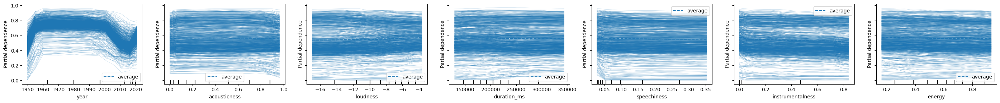

In [ ]:
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

# 1) Subsample de X_test_filtered
X_subpdp = X_test_filtered.sample(5000, random_state=42)

# 2) Pre-crea una figura con 1 fila y 7 columnas
fig, axs = plt.subplots(
    nrows=1, ncols=7,
    figsize=(28, 3),            # ajusta a tu gusto
    sharey=True                 # si quieres que todas compartan eje Y
)

# 3) Dibuja los 7 PDPs pasando el array de axes
PartialDependenceDisplay.from_estimator(
    model_rf_zero,
    X_subpdp,
    features=[
        'year',
        'acousticness',
        'loudness',
        'duration_ms',
        'speechiness',
        'instrumentalness',
        'energy'
    ],
    kind='both',
    grid_resolution=15,
    n_jobs=1,
    random_state=42,
    ax=axs                       # aquí van nuestras 7 columnas
)

plt.tight_layout()
plt.show()


In [ ]:
from sklearn import tree
import graphviz

# Extrae el primer árbol del bosque
estimator = model_rf_zero.named_steps['clf'].estimators_[0]

# Expórtalo en DOT y conviértelo a gráfico
dot_data = tree.export_graphviz(
    estimator,
    feature_names=features,
    class_names=['zero','non-zero'],
    rounded=True,
    proportion=True,
    filled=True
)
graph = graphviz.Source(dot_data)
graph

In [ ]:
import numpy as np
import shap


# 1) Prepare pipeline pieces
rf_clf        = model_rf_zero.named_steps['clf']
preprocessor  = model_rf_zero.named_steps['preprocessor']
X_train_trans = preprocessor.transform(X_train_filtered)
X_test_trans  = preprocessor.transform(X_test_filtered)

# 2) Subsample test set: exactly 10 000 or fewer rows
n_sub = min(10000, X_test_trans.shape[0])
idx_sub = np.random.choice(X_test_trans.shape[0], size=n_sub, replace=False)
X_sub = X_test_trans[idx_sub]

print(f"Computing SHAP on {X_sub.shape[0]} rows (should be ≤10000)")

# 3) Subsample background for explainer: exactly 1 000 or fewer rows
n_bg = min(1000, X_train_trans.shape[0])
bg_idx = np.random.choice(X_train_trans.shape[0], size=n_bg, replace=False)
background = X_train_trans[bg_idx]

print(f"Building explainer on {background.shape[0]} background rows (should be ≤1000)")



Computing SHAP on 10000 rows (should be ≤10000)
Building explainer on 1000 background rows (should be ≤1000)


In [ ]:
# 4) Single TreeExplainer
explainer = shap.TreeExplainer(rf_clf, data=background)

# 5) Compute SHAP values for class 1 (non-zero) on X_sub
#    shap_values returns [neg_class_matrix, pos_class_matrix]
shap_vals_pos = explainer.shap_values(X_sub)[1]

# 6) Now plot – all operations use only the 10 000-row X_sub
shap.summary_plot(
    shap_vals_pos,
    X_sub,
    feature_names=preprocessor.get_feature_names_out(),
    plot_type="bar"
)

shap.summary_plot(
    shap_vals_pos,
    X_sub,
    feature_names=preprocessor.get_feature_names_out()
)

shap.initjs()
shap.force_plot(
    explainer.expected_value[1],
    shap_vals_pos[0],
    X_sub[0],
    feature_names=preprocessor.get_feature_names_out()
)


  3%|=                   | 537/20000 [04:26<160:40]       

## Prueba de threshold

In [ ]:
y_proba = best_model_f1_macro.predict_proba(X_test)[:, 1]

thresholds = [0.3, 0.4, 0.5, 0.6, 0.7]

for t in thresholds:
    y_pred = (y_proba >= t).astype(int)
    f1 = f1_score(y_test, y_pred, average='macro')
    print(f"\n--- Umbral {t:.2f} ---")
    print(f"F1_macro: {f1:.4f}")
    print(classification_report(y_test, y_pred))


--- Umbral 0.30 ---
F1_macro: 0.5330
              precision    recall  f1-score   support

       False       0.89      0.15      0.26     14887
        True       0.69      0.99      0.81     28057

    accuracy                           0.70     42944
   macro avg       0.79      0.57      0.53     42944
weighted avg       0.76      0.70      0.62     42944


--- Umbral 0.40 ---
F1_macro: 0.6490
              precision    recall  f1-score   support

       False       0.66      0.39      0.49     14887
        True       0.73      0.89      0.81     28057

    accuracy                           0.72     42944
   macro avg       0.70      0.64      0.65     42944
weighted avg       0.71      0.72      0.70     42944


--- Umbral 0.50 ---
F1_macro: 0.6764
              precision    recall  f1-score   support

       False       0.55      0.67      0.60     14887
        True       0.80      0.70      0.75     28057

    accuracy                           0.69     42944
   macro avg  

In [ ]:
# Filtra solo las columnas numéricas
num_cols = X_train.select_dtypes(include=["int64", "float64"])

# Ahora sí puedes calcular la matriz de correlaciones
corr_matrix = num_cols.corr().abs()

# Parte superior de la matriz
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Detecta colinealidades altas (> 0.9 por ejemplo)
high_corr_cols = [column for column in upper.columns if any(upper[column] > 0.9)]

# Opcional: elimina esas columnas del X_train
X_train_filtered = X_train.drop(columns=high_corr_cols)

In [ ]:
# prompt: generar un modelo con las caracteristicas del mejor modelo de antes antes, pero esta vez con X_train_filtered para ver como reacciona

# Define el preprocesador con las características numéricas y categóricas
numeric_features_filtered = [
    col for col in X_train_filtered.columns if X_train_filtered[col].dtype in ["int64", "float64"]
]
categorical_features_filtered = [
    col for col in X_train_filtered.columns if X_train_filtered[col].dtype == "object"
]

preprocessor_filtered = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), numeric_features_filtered),
        ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_features_filtered),
    ]
)

# Crea el pipeline con el mejor modelo encontrado previamente y el nuevo preprocesador
pipeline_filtered = Pipeline(
    steps=[
        ("preprocessor", preprocessor_filtered),
        ("clf", RandomForestClassifier(class_weight='balanced', max_depth=20, max_features='sqrt', min_samples_leaf=1, min_samples_split=2, n_estimators=300))
    ]
)


# Entrena el modelo con X_train_filtered
pipeline_filtered.fit(X_train_filtered, y_train)

# Realiza predicciones en X_test (Asegúrate que X_test tenga las mismas columnas que X_train_filtered)
X_test_filtered = X_test.drop(columns=high_corr_cols)
y_pred_filtered = pipeline_filtered.predict(X_test_filtered)

# Evalúa el modelo
print(classification_report(y_test, y_pred_filtered))

# Prueba con diferentes umbrales
y_proba_filtered = pipeline_filtered.predict_proba(X_test_filtered)[:, 1]
thresholds = [0.3, 0.4, 0.5, 0.6, 0.7]
for t in thresholds:
    y_pred_filtered = (y_proba_filtered >= t).astype(int)
    f1 = f1_score(y_test, y_pred_filtered, average='macro')
    print(f"\n--- Umbral {t:.2f} ---")
    print(f"F1_macro: {f1:.4f}")
    print(classification_report(y_test, y_pred_filtered))


              precision    recall  f1-score   support

       False       0.55      0.67      0.60     14887
        True       0.80      0.71      0.75     28057

    accuracy                           0.69     42944
   macro avg       0.67      0.69      0.68     42944
weighted avg       0.71      0.69      0.70     42944


--- Umbral 0.30 ---
F1_macro: 0.5167
              precision    recall  f1-score   support

       False       0.90      0.13      0.22     14887
        True       0.68      0.99      0.81     28057

    accuracy                           0.69     42944
   macro avg       0.79      0.56      0.52     42944
weighted avg       0.76      0.69      0.61     42944


--- Umbral 0.40 ---
F1_macro: 0.6132
              precision    recall  f1-score   support

       False       0.71      0.29      0.42     14887
        True       0.71      0.94      0.81     28057

    accuracy                           0.71     42944
   macro avg       0.71      0.62      0.61     4294

Modelo 2

Cargar datos

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

# … (imports de modelos y métricas omitidos para brevedad) …

# 1) Lista de features y target
features = [
    col
    for col in df.columns
    if col
    not in [
        "id", "track_name", "artist_name", "new_popularity_2025",
        "genres", "main_genre", "subgenre_1", "subgenre_2",
        "genres_artists", "acousticness_cat", "danceability_cat",
        "energy_cat", "explicit_cat", "instrumentalness_cat",
        "liveness_cat", "loudness_cat", "speechiness_cat", "tempo_cat",
        "valence_cat", "month_cat", "featuring_cat", "popularity_2021_cat",
        "duration_cat", "key_cat", "imputed_date_cat", "mode_cat",
        "year_cat", "genres_from_artists_cat", "popularity_2025_cat",
        "album", "popularity_2024", "popularity_2024_cat",
        "popularity_2021", "confidence", "imputed_genre"
    ]
]
target = "new_popularity_2025"

# 2) Construcción de X e y desde df y limpieza de NaN
X = df[features].copy()
X.dropna(inplace=True)
y = df[target].loc[X.index].copy()

# 3) Filtrar top-20 géneros
top20 = X['genre_final'].value_counts().head(20).index
mask_top20 = X['genre_final'].isin(top20)
X = X.loc[mask_top20]
y = y.loc[mask_top20]

# 4) Filtrar solo los casos con popularidad > 0
mask_pos = y > 0
X = X.loc[mask_pos]
y = y.loc[mask_pos]

# 5) División en training/test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 6) Eliminación de colinealidades en X_train y aplicación a X_test
num_cols = X_train.select_dtypes(include=["int64", "float64"])
corr_matrix = num_cols.corr().abs()
upper = corr_matrix.where(
    np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
)
high_corr_cols = [col for col in upper.columns if any(upper[col] > 0.9)]

X_train_filtered = X_train.drop(columns=high_corr_cols)
X_test_filtered  = X_test.drop(columns=high_corr_cols)

print("Shapes tras filtrar pos y colinealidad:")
print(" X_train_filtered:", X_train_filtered.shape)
print(" X_test_filtered: ", X_test_filtered.shape)


Shapes tras filtrar pos y colinealidad:
 X_train_filtered: (112368, 35)
 X_test_filtered:  (28093, 35)


Pipeline

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


# 6) Preprocesador
numeric_features = X_train_filtered.select_dtypes(include=["int64","float64"]).columns.tolist()
categorical_features = X_train_filtered.select_dtypes(include=["object"]).columns.tolist()
preprocessor = ColumnTransformer([
    ("num", StandardScaler(), numeric_features),
    ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_features),
])

# 7) Definición de modelos y sus param_grids
grids = {
    'rf': {
        'estimator': RandomForestRegressor(random_state=42),
        'param_grid': {
            'reg__n_estimators': [100,200,300],
            'reg__max_depth': [None,10,20],
            'reg__min_samples_split': [2,5],
            'reg__min_samples_leaf': [1,2],
            'reg__max_features': ['sqrt','log2'],
        }
    },
    'xgb': {
        'estimator': XGBRegressor(random_state=42, objective='reg:squarederror', eval_metric='rmse'),
        'param_grid': {
            'reg__n_estimators': [100,200,300],
            'reg__learning_rate': [0.01,0.05,0.1],
            'reg__max_depth': [5,10],
            'reg__gamma': [0,1,5],
        }
    },
    'gbm': {
        'estimator': GradientBoostingRegressor(random_state=42),
        'param_grid': {
            'reg__n_estimators': [100,200],
            'reg__learning_rate': [0.05,0.1],
            'reg__max_depth': [3,5],
            'reg__subsample': [0.8,1.0],
        }
    },
    'knn': {
        'estimator': KNeighborsRegressor(),
        'param_grid': {
            'reg__n_neighbors': [3,5,7],
            'reg__weights': ['uniform','distance'],
            'reg__p': [1,2],
        }
    }
}

# 8) GridSearch para cada modelo y guardado del mejor
best_models = {}
test_metrics = []
scoring = {'RMSE':'neg_root_mean_squared_error','MAE':'neg_mean_absolute_error','R2':'r2'}

for name, cfg in grids.items():
    pipe = Pipeline([('preprocessor', preprocessor), ('reg', cfg['estimator'])])
    grid = GridSearchCV(
        pipe, cfg['param_grid'], scoring=scoring, refit='RMSE',
        cv=3, return_train_score=True, verbose=3, n_jobs=1
    )
    print(f"\n=== Training {name.upper()} ===")
    grid.fit(X_train_filtered, y_train)
    best_models[name] = grid.best_estimator_

# 9) Cálculo de métricas de test para cada mejor modelo
for name, model in best_models.items():
    y_pred = model.predict(X_test_filtered)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae  = mean_absolute_error(y_test, y_pred)
    r2   = r2_score(y_test, y_pred)
    test_metrics.append({'model': name, 'RMSE': rmse, 'MAE': mae, 'R2': r2})

# 10) Presentación de resultados comparativos
df_results = pd.DataFrame(test_metrics)
print("\n=== Comparison of Best Models ===")
print(df_results)



=== Training RF ===
Fitting 3 folds for each of 72 candidates, totalling 216 fits
[CV 1/3] END reg__max_depth=None, reg__max_features=sqrt, reg__min_samples_leaf=1, reg__min_samples_split=2, reg__n_estimators=100; MAE: (train=-4.437, test=-11.921) R2: (train=0.899, test=0.282) RMSE: (train=-5.677, test=-15.115) total time=  43.2s
[CV 2/3] END reg__max_depth=None, reg__max_features=sqrt, reg__min_samples_leaf=1, reg__min_samples_split=2, reg__n_estimators=100; MAE: (train=-4.434, test=-11.893) R2: (train=0.899, test=0.285) RMSE: (train=-5.686, test=-15.074) total time=  41.4s
[CV 3/3] END reg__max_depth=None, reg__max_features=sqrt, reg__min_samples_leaf=1, reg__min_samples_split=2, reg__n_estimators=100; MAE: (train=-4.426, test=-11.961) R2: (train=0.899, test=0.280) RMSE: (train=-5.666, test=-15.160) total time=  42.1s
[CV 1/3] END reg__max_depth=None, reg__max_features=sqrt, reg__min_samples_leaf=1, reg__min_samples_split=2, reg__n_estimators=200; MAE: (train=-4.402, test=-11.897) R

In [ ]:
print("=== Comparison of Best Models ===")
print(df_results)

=== Comparison of Best Models ===
  model       RMSE        MAE        R2
0    rf  14.871112  11.724581  0.299426
1   xgb  14.770578  11.536209  0.308866
2   gbm  14.945273  11.739734  0.292421
3   knn  16.497899  13.009001  0.137767


In [ ]:
# prompt: sin hacer de nuevo gridsearch, a partir de la informacion guardada en el diccionario best models, saca para cada modelo tiempos de ejecucion y otras metricas de precision adicionales. Además imprime los parámetros de cada modelo en best models

import time

# Assuming 'best_models' dictionary is already populated from previous code

for model_name, model in best_models.items():
    print(f"\n--- Model: {model_name.upper()} ---")
    print("Parameters:", model.get_params())  # Print model parameters

    start_time = time.time()
    y_pred = model.predict(X_test_filtered)
    end_time = time.time()

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Execution Time: {end_time - start_time:.4f} seconds")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R^2: {r2:.4f}")



--- Model: RF ---
Parameters: {'memory': None, 'steps': [('preprocessor', ColumnTransformer(transformers=[('num', StandardScaler(),
                                 ['acousticness', 'danceability', 'duration_ms',
                                  'energy', 'explicit', 'instrumentalness',
                                  'key', 'liveness', 'loudness', 'mode',
                                  'speechiness', 'tempo', 'valence', 'year',
                                  'month_sin', 'month_cos', 'dayofweek_sin',
                                  'dayofweek_cos', 'energy_valence',
                                  'speechiness_explicit',
                                  'danceability_tempo']),
                                ('cat', OneHotEncoder(handle_unknown='ignore'),
                                 ['season', 'genre_final'])])), ('reg', RandomForestRegressor(max_features='sqrt', min_samples_leaf=2, n_estimators=300,
                      random_state=42))], 'transform_input': None

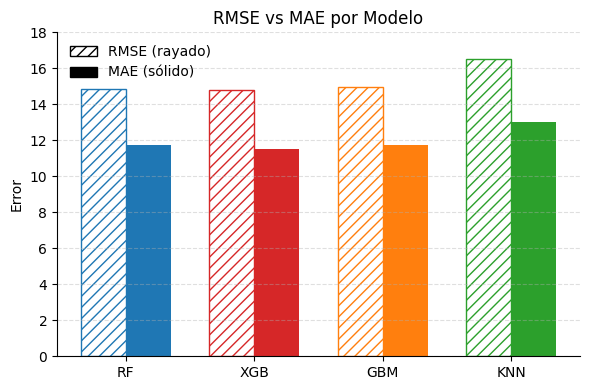

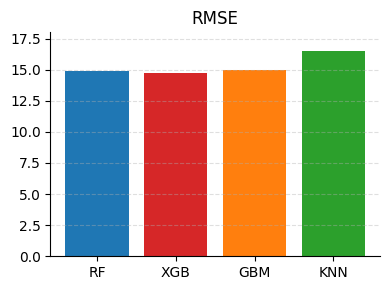

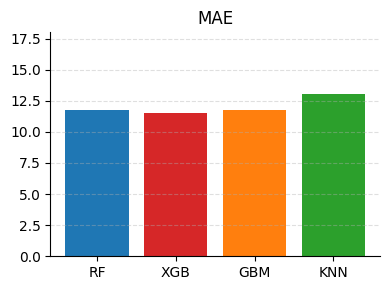

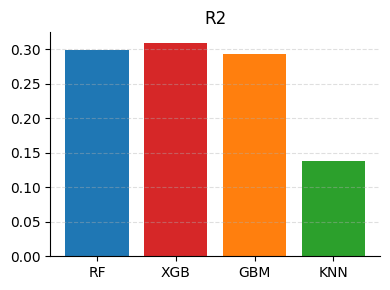

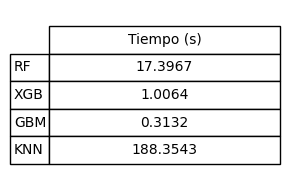

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import pandas as pd
import numpy as np

# ——— Datos previos ———
# df_results debe tener ['model','RMSE','MAE','R2']
execution_times = {
    'rf':  17.3967,
    'xgb':  1.0064,
    'gbm':  0.3132,
    'knn':188.3543
}
df_results['Execution Time'] = df_results['model'].map(execution_times)

# Colores vivos por modelo
colors = {'rf':'tab:blue','xgb':'tab:red','gbm':'tab:orange','knn':'tab:green'}

# ——— 1) Gráfica conjunta RMSE (rayado) vs MAE (sólido) ———
models = df_results['model'].values
x = np.arange(len(models))
w = 0.35

fig, ax = plt.subplots(figsize=(6,4))

# RMSE: barras rayadas
for xi, m in zip(x - w/2, models):
    ax.bar(xi,
           df_results.loc[df_results.model == m, 'RMSE'].iloc[0],
           width=w,
           facecolor='white',
           edgecolor=colors[m],
           hatch='///')

# MAE: barras sólidas
ax.bar(x + w/2,
       df_results['MAE'],
       width=w,
       color=[colors[m] for m in models])

# Leyenda de patrones
handles = [
    Patch(facecolor='white', edgecolor='black', hatch='///', label='RMSE (rayado)'),
    Patch(facecolor='black', edgecolor='black', label='MAE (sólido)')
]
ax.legend(handles=handles, frameon=False)

# Etiquetas en mayúscula
ax.set_xticks(x)
ax.set_xticklabels([m.upper() for m in models])

ax.set_ylim(0, 18)
ax.set_ylabel('Error')
ax.set_title('RMSE vs MAE por Modelo')

# Estilo minimalista
for spine in ['top','right']:
    ax.spines[spine].set_visible(False)
ax.grid(axis='y', ls='--', alpha=0.4)
plt.tight_layout()
plt.show()


# ——— 2) Gráficos separados para cada métrica ———
for metric in ['RMSE','MAE','R2']:
    fig, ax = plt.subplots(figsize=(4,3))
    ax.bar([m.upper() for m in models],
           df_results[metric],
           color=[colors[m] for m in models])
    ax.set_title(metric)
    if metric in ['RMSE','MAE']:
        ax.set_ylim(0, 18)
    for spine in ['top','right']:
        ax.spines[spine].set_visible(False)
    ax.grid(axis='y', ls='--', alpha=0.4)
    plt.tight_layout()
    plt.show()


# ——— 3) Tabla de tiempos de ejecución ———
df_table = df_results[['model','Execution Time']].copy()
df_table['model'] = df_table['model'].str.upper()
df_table.set_index('model', inplace=True)

fig, ax = plt.subplots(figsize=(3,2))
ax.axis('off')
tbl = ax.table(
    cellText=df_table.values,
    rowLabels=df_table.index,
    colLabels=['Tiempo (s)'],
    loc='center',
    cellLoc='center'
)
tbl.auto_set_font_size(False)
tbl.set_fontsize(10)
tbl.scale(1, 1.5)
plt.tight_layout()
plt.show()


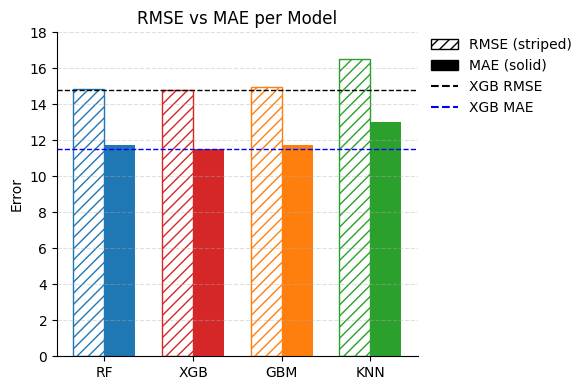

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

# 1) Store metrics in a dictionary
data_dict = {
    'rf':  {'RMSE': 14.871112, 'MAE': 11.724581, 'R2': 0.299426},
    'xgb': {'RMSE': 14.770578, 'MAE': 11.536209, 'R2': 0.308866},
    'gbm': {'RMSE': 14.945273, 'MAE': 11.739734, 'R2': 0.292421},
    'knn': {'RMSE': 16.497899, 'MAE': 13.009001, 'R2': 0.137767},
}

# 2) Prepare data for plotting
colors = {'rf':'tab:blue','xgb':'tab:red','gbm':'tab:orange','knn':'tab:green'}
models = list(data_dict.keys())
rmse   = [data_dict[m]['RMSE'] for m in models]
mae    = [data_dict[m]['MAE']  for m in models]

x = np.arange(len(models))
w = 0.35

# 3) Create the bar chart
fig, ax = plt.subplots(figsize=(6,4))

# RMSE (striped)
for xi, m, y in zip(x - w/2, models, rmse):
    ax.bar(xi, y, width=w, facecolor='white', edgecolor=colors[m], hatch='///')

# MAE (solid)
ax.bar(x + w/2, mae, width=w, color=[colors[m] for m in models])

# 4) Add horizontal dashed lines at XGB’s RMSE and MAE
xgb_rmse = data_dict['xgb']['RMSE']
xgb_mae  = data_dict['xgb']['MAE']
ax.axhline(xgb_rmse, color='black', linestyle='--', linewidth=1, label=f"XGB RMSE = {xgb_rmse:.4f}")
ax.axhline(xgb_mae,  color='blue',  linestyle='--', linewidth=1, label=f"XGB MAE  = {xgb_mae:.4f}")

# 5) Legend in English, placed outside upper-left
bar_handles = [
    Patch(facecolor='white', edgecolor='black', hatch='///', label='RMSE (striped)'),
    Patch(facecolor='black', edgecolor='black', label='MAE (solid)')
]
line_handles = [
    Line2D([0],[0], color='black', linestyle='--', label='XGB RMSE'),
    Line2D([0],[0], color='blue',  linestyle='--', label='XGB MAE')
]
ax.legend(handles=bar_handles + line_handles,
          loc='upper left',
          bbox_to_anchor=(1.02, 1),   # outside to the right
          borderaxespad=0,
          frameon=False)

# 6) Styling
ax.set_xticks(x)
ax.set_xticklabels([m.upper() for m in models])
ax.set_ylim(0, 18)
ax.set_ylabel('Error')
ax.set_title('RMSE vs MAE per Model')
ax.grid(axis='y', ls='--', alpha=0.4)
for spine in ['top','right']:
    ax.spines[spine].set_visible(False)

plt.tight_layout()
plt.show()


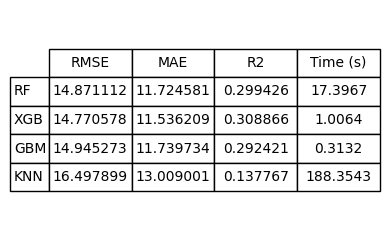

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 1) Recreate the timing table
df_time = pd.DataFrame({
    'Time (s)': [17.3967, 1.0064, 0.3132, 188.3543]
}, index=['RF', 'XGB', 'GBM', 'KNN'])

# 2) Recreate the metrics table
df_metrics = pd.DataFrame({
    'model': ['RF', 'XGB', 'GBM', 'KNN'],
    'RMSE': [14.871112, 14.770578, 14.945273, 16.497899],
    'MAE':  [11.724581, 11.536209, 11.739734, 13.009001],
    'R2':   [ 0.299426,  0.308866,  0.292421,  0.137767]
})

df_metrics["Time (s)"] = df_time["Time (s)"].values
# 3) Display the metrics DataFrame nicely
fig, ax = plt.subplots(figsize=(4, 2.5))
ax.axis('off')
tbl = ax.table(
    cellText=df_metrics[['RMSE','MAE','R2', "Time (s)"]].values,
    rowLabels=df_metrics['model'],
    colLabels=['RMSE', 'MAE', 'R2', 'Time (s)'],
    loc='center',
    cellLoc='center'
)
tbl.auto_set_font_size(False)
tbl.set_fontsize(10)
tbl.scale(1, 1.5)
plt.tight_layout()
plt.show()


LOAD XGBOOST MODEL

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor
import joblib

# 1) Recreate the preprocessor
numeric_features = X_train_filtered.select_dtypes(include=["int64", "float64"]).columns.tolist()
categorical_features = X_train_filtered.select_dtypes(include=["object"]).columns.tolist()

preprocessor = ColumnTransformer([
    ("num", StandardScaler(), numeric_features),
    ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_features),
])

# 2) Build the XGBoost pipeline with the tuned hyperparameters
xgb_pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("reg", XGBRegressor(
        objective="reg:squarederror",
        eval_metric="rmse",
        learning_rate=0.05,
        max_depth=10,
        n_estimators=200,
        gamma=1,
        random_state=42
    ))
])


# 3) Fit on the training data
xgb_pipeline.fit(X_train_filtered, y_train)

# 4) Evaluate on the test set
y_pred = xgb_pipeline.predict(X_test_filtered)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae  = mean_absolute_error(y_test, y_pred)
r2   = r2_score(y_test, y_pred)

print(f"XGBoost test performance → RMSE: {rmse:.4f}, MAE: {mae:.4f}, R²: {r2:.4f}")

# 5) Save the fitted pipeline to disk
#joblib.dump(xgb_pipeline, "xgb_second_stage_pipeline.joblib")
#print("Saved fitted XGBoost pipeline to 'xgb_second_stage_pipeline.joblib'")


XGBoost test performance → RMSE: 14.7706, MAE: 11.5362, R²: 0.3089


100%|===================| 19983/20000 [12:50<00:00]       

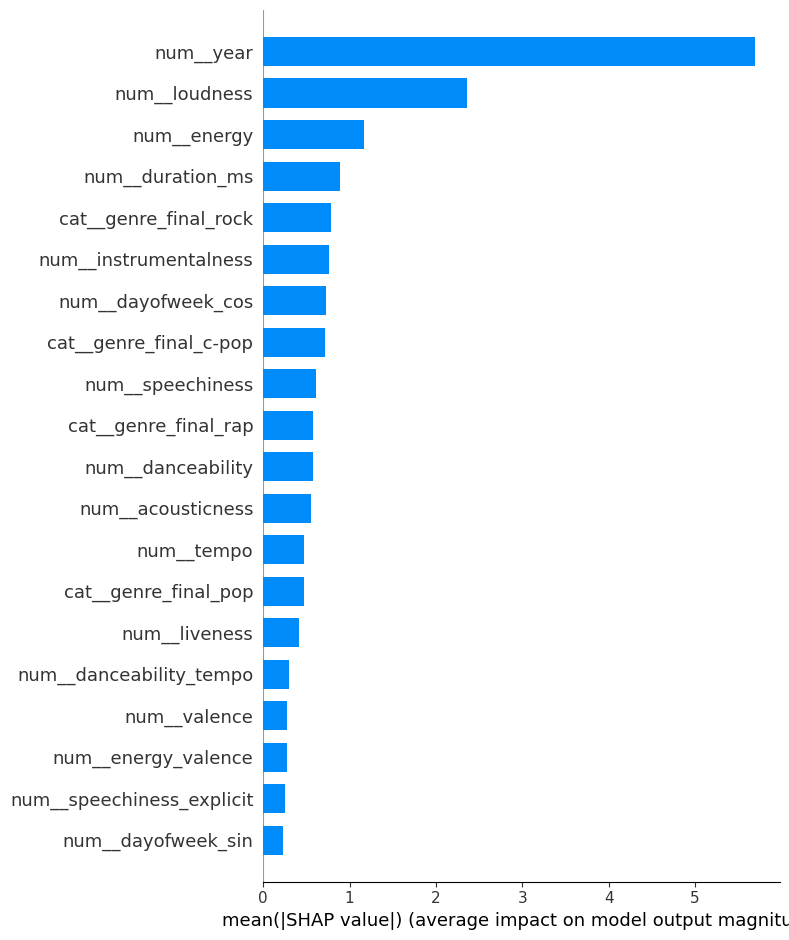

<Figure size 640x480 with 0 Axes>

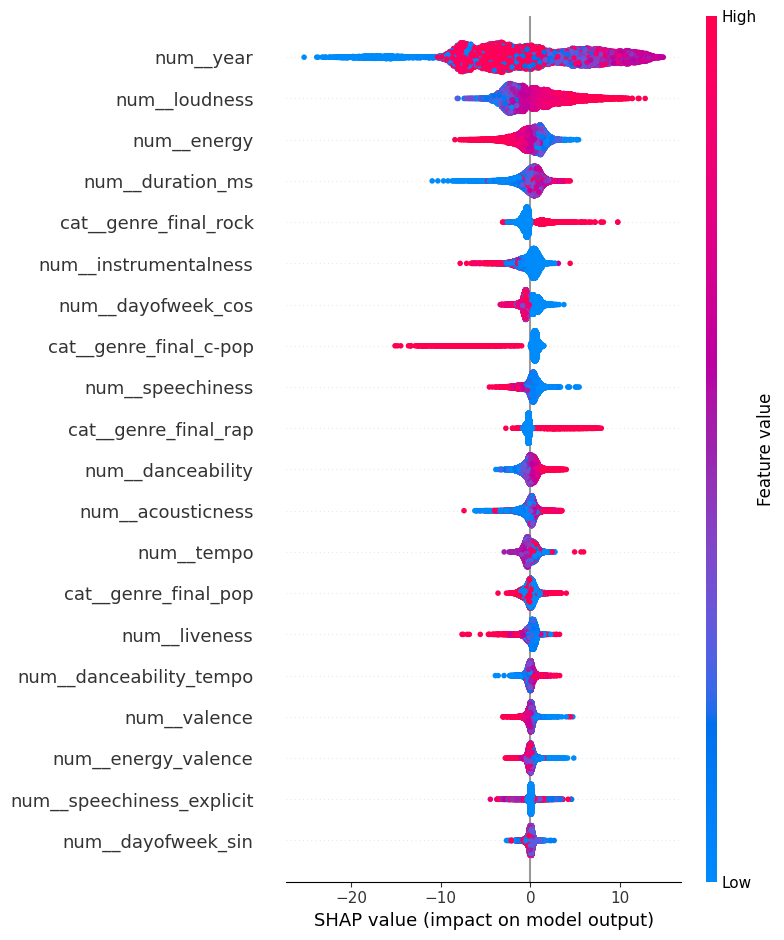

<Figure size 640x480 with 0 Axes>

In [ ]:
import shap
import matplotlib.pyplot as plt
import numpy as np

# 1) Extract pipeline components
pipeline = xgb_pipeline
preprocessor = pipeline.named_steps['preprocessor']
xgb_model    = pipeline.named_steps['reg']

# 2) Preprocess full test set
X_test_transformed = preprocessor.transform(X_test_filtered)

# 3) Subsample para acelerar SHAP (por ejemplo, 300 filas)
n_sub = min(20000, X_test_transformed.shape[0])
idx_sub = np.random.choice(X_test_transformed.shape[0], size=n_sub, replace=False)
X_sub = X_test_transformed[idx_sub]

# 4) Crea un conjunto de fondo pequeño desde el entrenamiento (por ejemplo, 100 filas)
X_train_transformed = preprocessor.transform(X_train_filtered)
n_bg = min(500, X_train_transformed.shape[0])
bg_idx = np.random.choice(X_train_transformed.shape[0], size=n_bg, replace=False)
background = X_train_transformed[bg_idx]

# 5) Inicializa TreeExplainer con el background klein
explainer = shap.TreeExplainer(
    xgb_model,
    data=background  # modo rápido
)

# 6) Calcula SHAP solo sobre la muestra
shap_values = explainer.shap_values(X_sub)

# 7) Importancia global (barras)
plt.figure(figsize=(8,6))
shap.summary_plot(
    shap_values,
    X_sub,
    feature_names=preprocessor.get_feature_names_out(),
    plot_type="bar"
)
plt.tight_layout()
plt.show()

# 8) Beeswarm detallado
plt.figure(figsize=(8,6))
shap.summary_plot(
    shap_values,
    X_sub,
    feature_names=preprocessor.get_feature_names_out()
)
plt.tight_layout()
plt.show()

# 9) Explicación local (primer punto de la muestra)
shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values[0],
    X_sub[0],
    feature_names=preprocessor.get_feature_names_out()
)


In [ ]:
import pandas as pd
import numpy as np

# 1) Obtén el array de shap_values adecuado (para clasificación binaria suele venir como lista de dos arrays)
#    Si shap_values es lista: shap_values[1] = contribuciones para la clase positiva
shap_arr = shap_values[1] if isinstance(shap_values, list) else shap_values

# 2) Nombres de las features tras el preprocesador
feature_names = preprocessor.get_feature_names_out()

# 3) Importancia global = media de |SHAP| por columna
mean_abs_shap = np.abs(shap_arr).mean(axis=0)

# 4) Construye el DataFrame y ordénalo
df_shap_importance = pd.DataFrame({
    'feature': feature_names,
    'mean_abs_shap': mean_abs_shap
})
df_shap_importance.sort_values('mean_abs_shap', ascending=False, inplace=True)
df_shap_importance.reset_index(drop=True, inplace=True)

# 5) Muestra la tabla
print(df_shap_importance)
# o en notebook: display(df_shap_importance)


                              feature  mean_abs_shap
0                           num__year       5.697670
1                       num__loudness       2.362570
2                         num__energy       1.162376
3                    num__duration_ms       0.888357
4               cat__genre_final_rock       0.781711
5               num__instrumentalness       0.755908
6                  num__dayofweek_cos       0.732104
7              cat__genre_final_c-pop       0.720155
8                    num__speechiness       0.614175
9                cat__genre_final_rap       0.574466
10                  num__danceability       0.571989
11                  num__acousticness       0.554422
12                         num__tempo       0.475983
13               cat__genre_final_pop       0.467423
14                      num__liveness       0.409389
15            num__danceability_tempo       0.294131
16                       num__valence       0.273990
17                num__energy_valence       0.

"IGNORAR"

In [ ]:
from scipy.stats import zscore

# Filtrar outliers si z-score absoluto > 3 en alguna variable numérica
z_scores = np.abs(zscore(X_train.select_dtypes(include=np.number)))
mask = (z_scores < 3).all(axis=1)
X_train_no_outliers = X_train_filtered[mask]
y_train_no_outliers = y_train[mask]

In [ ]:
print("🔢 Tamaño original:", X_train_filtered.shape, y_train.shape)
print("📉 Tamaño sin outliers:", X_train_no_outliers.shape, y_train_no_outliers.shape)

🔢 Tamaño original: (224360, 33) (224360,)
📉 Tamaño sin outliers: (194087, 33) (194087,)


In [ ]:
numeric_features = [
    col for col in X_train_no_outliers.columns if X_train_no_outliers[col].dtype in ["int64", "float64"]
]
categorical_features = [
    col for col in X_train_no_outliers.columns if X_train_no_outliers[col].dtype == "object"]

preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), numeric_features),
        ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ]
)

pipeline = Pipeline([("preprocessor", preprocessor), ("clf", RandomForestClassifier())])

In [ ]:
numeric_features = [
    col for col in X_train_no_outliers
    .columns if X_train_no_outliers[col].dtype in ["int64", "float64"]
]
categorical_features = [
    col for col in X_train_no_outliers.columns if X_train_no_outliers[col].dtype == "object"
]

preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), numeric_features),
        ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ]
)

param_grid = [
    {
        "clf": [RandomForestClassifier(class_weight="balanced")],
        "clf__n_estimators": [100, 200, 300],
        "clf__max_depth": [None, 10, 20],
        "clf__min_samples_split": [2, 5],
        "clf__min_samples_leaf": [1, 2],
        "clf__max_features": ["sqrt", "log2"],
    },
    {
        "clf": [GradientBoostingClassifier()],
        "clf__n_estimators": [100, 200, 300],
        "clf__learning_rate": [0.01, 0.05, 0.1],
        "clf__max_depth": [3, 5, 10],
        "clf__subsample": [0.8, 1.0],
        "clf__max_features": ["sqrt", "log2"],
    },
    {
        "clf": [
            LogisticRegression(
                max_iter=1000, solver="liblinear", class_weight="balanced"
            )
        ],
        "clf__C": [0.01, 0.1, 1.0, 10.0, 100.0],
        "clf__penalty": ["l1", "l2"],
    },
    {
        "clf": [XGBClassifier(eval_metric="logloss")],
        "clf__n_estimators": [100, 200, 300],
        "clf__learning_rate": [0.01, 0.05, 0.1],
        "clf__max_depth": [3, 5, 10],
        "clf__subsample": [0.8, 1.0],
        "clf__colsample_bytree": [0.8, 1.0],
        "clf__gamma": [0, 1, 5],
    },
]

pipeline = Pipeline([("preprocessor", preprocessor), ("clf", RandomForestClassifier())])

grid = GridSearchCV(
    pipeline, param_grid, scoring="f1_macro", cv=2, verbose=2, n_jobs=-1
)

grid.fit(X_train, y_train)

best_model_f1_macro = grid.best_estimator_

Fitting 2 folds for each of 514 candidates, totalling 1028 fits
[CV] END clf=RandomForestClassifier(class_weight='balanced'), clf__max_depth=None, clf__max_features=sqrt, clf__min_samples_leaf=1, clf__min_samples_split=5, clf__n_estimators=100; total time= 2.0min
[CV] END clf=RandomForestClassifier(class_weight='balanced'), clf__max_depth=None, clf__max_features=sqrt, clf__min_samples_leaf=1, clf__min_samples_split=5, clf__n_estimators=100; total time= 2.1min
[CV] END clf=RandomForestClassifier(class_weight='balanced'), clf__max_depth=None, clf__max_features=sqrt, clf__min_samples_leaf=1, clf__min_samples_split=2, clf__n_estimators=100; total time= 2.1min
[CV] END clf=RandomForestClassifier(class_weight='balanced'), clf__max_depth=None, clf__max_features=sqrt, clf__min_samples_leaf=1, clf__min_samples_split=2, clf__n_estimators=100; total time= 2.1min
[CV] END clf=RandomForestClassifier(class_weight='balanced'), clf__max_depth=None, clf__max_features=sqrt, clf__min_samples_leaf=2, clf_

In [ ]:
best_model_f1_macro

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['acousticness',
                                                   'danceability',
                                                   'duration_ms', 'energy',
                                                   'explicit',
                                                   'instrumentalness', 'key',
                                                   'liveness', 'loudness',
                                                   'mode', 'speechiness',
                                                   'tempo', 'valence', 'year',
                                                   'month_sin', 'month_cos',
                                                   'dayofweek_sin',
                                                   'dayofweek_cos',
                                                   'energy_valence',
                                                   'speechiness_explicit',
                                                   'danceability_tempo']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['season'])])),
                ('clf',
                 RandomForestClassifier(class_weight='balanced', max_depth=20,
                                        min_samples_leaf=2,
                                        n_estimators=300))])

In [ ]:
y_pred = best_model_f1_macro.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.55      0.64      0.59     19439
        True       0.79      0.73      0.76     36652

    accuracy                           0.70     56091
   macro avg       0.67      0.68      0.68     56091
weighted avg       0.71      0.70      0.70     56091



In [ ]:
X_train_pos = X_train[y_train]
y_train_pos = y_train[y_train]

In [ ]:
import joblib

# Supongamos que tu modelo entrenado se llama 'modelo_final'
joblib.dump(best_model_f1_macro, "modelo_final.pkl")

['modelo_final.pkl']

Zero inflated model

In [ ]:
import numpy as np
import joblib
from sklearn.base import BaseEstimator, RegressorMixin

class ZeroInflatedModel(BaseEstimator, RegressorMixin):
    """
    Two‐stage zero‐inflated model:
      1) classifier.predict(X) => {0,1}
      2) regressor.predict(X) => continuous prediction (only if classifier==1)
      Final: 0 if classifier==0, else regressor output.
    """
    def __init__(self, classifier, regressor):
        self.classifier = classifier
        self.regressor  = regressor

    def fit(self, X, y):
        # 1) Entrena el clasificador en y_binary = (y>0)
        y_binary = (y > 0).astype(int)
        self.classifier.fit(X, y_binary)
        # 2) Entrena el regresor sólo con los casos y>0
        mask_pos = y > 0
        self.regressor.fit(X[mask_pos], y[mask_pos])
        return self

    def predict(self, X):
        # 1) Clasificación 0 vs. >0
        y_bin_pred = self.classifier.predict(X)
        # 2) Predicción continua sólo donde y_bin_pred==1
        y_cont_pred = self.regressor.predict(X)
        # 3) Aplica zero‐inflation
        return np.where(y_bin_pred == 1, y_cont_pred, 0)

    def predict_proba(self, X):
        # Sólo para exponer las probabilidades de la etapa 1
        return self.classifier.predict_proba(X)

# ----------------------------------------------------------
# Ejemplo de uso, asumiendo pipelines ya entrenados:
#    model_rf_zero.fit(X_train_filtered, y_train_binary)
#    xgb_pipeline.fit(X_train_filtered_pos, y_train_pos)

zero_inf_model = ZeroInflatedModel(
    classifier=model_rf_zero,
    regressor=xgb_pipeline
)

# (Re‐)entrena todo junto si fuera necesario:
# zero_inf_model.fit(X_train_filtered, y_train_continuous)

# Guarda el ensemble completo
joblib.dump(zero_inf_model, "zero_inflated_model.joblib")

# Carga y predicción posteriores:
# loaded = joblib.load("zero_inflated_model.joblib")
# y_pred = loaded.predict(X_new)


['zero_inflated_model.joblib']

In [ ]:
# prompt: coger una fila random de X que no sea del top20 genres y pasarla por el zero inflated model

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from xgboost import XGBClassifier, XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import joblib
from sklearn.base import BaseEstimator, RegressorMixin


# Assuming X, y, X_train_filtered, X_test_filtered, y_train, y_test are already defined
# and the model_rf_zero and xgb_pipeline are trained as shown in your previous code
X = df[features]
X.dropna(inplace=True)
# Select a random row from X_test_filtered that does not belong to the top 20 genres
# Find all genres that are not in the top 20
not_top_20 = X[~X['genre_final'].isin(top20_genres)].index



<ipython-input-26-a188e657c55c>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.dropna(inplace=True)


In [ ]:
y.iloc[280448]

np.int64(48)

In [ ]:
# prompt: sacar de X e y la primera fila y cambiar el valor de genre_final por "jazz", quitar de first_row_X la columna que no sale en X_train_filtered

# Assuming X and y are defined as in your original code
first_row_X = X.iloc[[280448]].copy()
first_row_X['genre_final'] = 'jazz'

# Get the columns present in X_train_filtered
columns_to_keep = X_train_filtered.columns

# Drop columns from first_row_X that are not in X_train_filtered
first_row_X = first_row_X[columns_to_keep]
first_row_y = y.iloc[280448]

first_row_X, first_row_y


(        acousticness  danceability  duration_ms  energy  explicit  \
 280450         0.263          0.76       109595   0.794         1   
 
         instrumentalness  key  liveness  loudness  mode  speechiness   tempo  \
 280450           0.00324   10    0.0996    -4.311     0        0.344  165.99   
 
         valence    year  month_sin  month_cos  dayofweek_sin  dayofweek_cos  \
 280450    0.583  2020.0       -0.5  -0.866025            0.0            1.0   
 
         is_weekend  season  is_positive_mood  has_lyrics  is_loud  is_live  \
 280450       False  Summer             False        True     True    False   
 
         is_common_key  is_instrumental  is_energetic  is_duration_friendly  \
 280450          False            False          True                 False   
 
         is_danceable  is_acoustic  energy_valence  speechiness_explicit  \
 280450          True        False        0.462902                 0.344   
 
         danceability_tempo  genre_was_imputed genre_final

In [ ]:
y_pred_zero_inflated = zero_inf_model.predict(first_row_X)

print(f"Prediction of Zero Inflated Model: {y_pred_zero_inflated}")

Prediction of Zero Inflated Model: [32.706482]
